In [1]:
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please ensure you have installed TensorFlow correctly')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 2.1.0
Default GPU Device: /device:GPU:0


In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from pandas.plotting import register_matplotlib_converters
from sklearn.model_selection import train_test_split
import urllib
import os
import csv
import cv2
import time
from PIL import Image

from keras_retinanet import models
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color

ModuleNotFoundError: No module named 'keras_retinanet'

In [9]:
from keras.models import load_model
from keras_retinanet import models

model_path = os.path.join('snapshots', sorted(os.listdir('snapshots'), reverse=True)[0])
print(model_path)

model = models.load_model(model_path, backbone_name='resnet50')
model = models.convert_model(model)

labels_to_names = pd.read_csv('classes.csv', header=None).T.loc[0].to_dict()

snapshots\resnet50_csv_25.h5


NameError: name 'models' is not defined

In [4]:
test_df = pd.read_csv("annotations_test.csv")
test_df.head()
print(labels_to_names)

{0: 'mask', 1: 'no_mask'}


In [5]:
import skimage.io as io

def predict(image):
    image = preprocess_image(image.copy())
    image, scale = resize_image(image)

    boxes, scores, labels = model.predict_on_batch(
     np.expand_dims(image, axis=0)
     )

    boxes /= scale

    return boxes, scores, labels

umbralScore = 0.4

def draw_detections(image, boxes, scores, labels):
      for box, score, label in zip(boxes[0], scores[0], labels[0]):
        if score < umbralScore:
            break

        #color = label_color(label)

        b = box.astype(int)
        if label == 0:
            color = [0,255,0]
        elif label == 1:
            color = [255,0,0]
        draw_box(draw, b, color=color)
        caption = "{} ".format(labels_to_names[label])
        draw_caption(draw, b, caption.upper())
        #draw_box(image, b, color=color)

        #caption = "{} {:.3f}".format(labels_to_names[label], score)
        #draw_caption(image, b, caption)

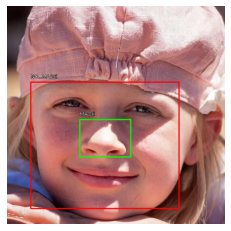

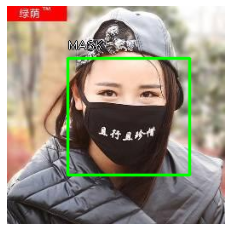

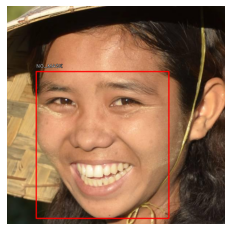

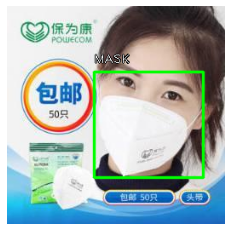

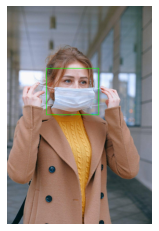

...

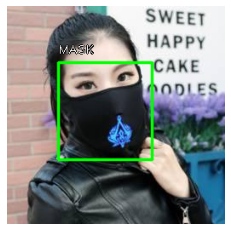

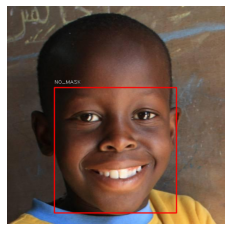

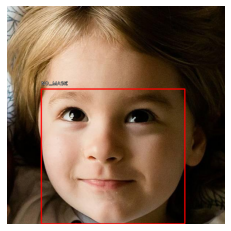

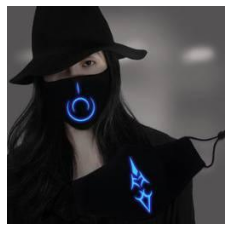

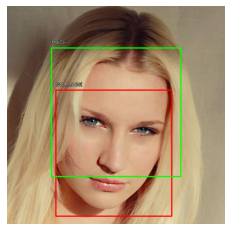

KeyboardInterrupt: 

In [12]:
for index, row in test_df.iterrows():
    #print(row[0], index)
    image = io.imread(row[0])
    #image = io.imread('images/new_16.jpg')

    boxes, scores, labels = predict(image)

    draw = image.copy()
    draw_detections(draw, boxes, scores, labels)

    plt.axis('off')
    plt.imshow(draw)
    plt.show()

In [2]:
# get the reference to the webcam
camera = cv2.VideoCapture(0)
camera_height = 500

while(True):
    # read a new frame
    _, frame = camera.read()
    
 
    boxes, scores, labels = predict(frame)

 
    draw = frame.copy()


    for box, score, label in zip(boxes[0], scores[0], labels[0]):
        if score > 0.5:
            #print(box)
            b = box.astype(int)
            if label == 0:
                color = [0,255,0]
            elif label == 1:
                color = [0,0,255]

            draw_box(draw, b, color=color)
            caption = "{} {:.1f}".format(labels_to_names[label], score)
            draw_caption(draw, b, caption.upper())
            


    # show the frame
    cv2.imshow("Test out", draw)


    key = cv2.waitKey(1)

    # quit camera if 'q' key is pressed
    if key & 0xFF == ord("q"):
        break

camera.release()
cv2.destroyAllWindows()

NameError: name 'cv2' is not defined

In [4]:
camera.release()

NameError: name 'camera' is not defined

In [1]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


C:\Users\Usuario\anaconda3\python.exe: No module named pip
